In [1]:
import os
os.environ["OMP_NUM_THREADS"] = '4'

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

In [2]:
df = pd.read_csv('train.csv', skipinitialspace=True) 
del df['features_duration_ms']
del df['popularity_confidence']

In [3]:
df.dtypes

name                 object
duration_ms           int64
explicit               bool
popularity            int64
artists              object
album_name           object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature      float64
n_beats             float64
n_bars              float64
processing          float64
genre                object
dtype: object

In [4]:
pd.set_option('display.max_columns', None)
df.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
0,Long Road,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,1.0,0.0975,0.302000,0.53600,0.281,0.6350,142.221,4.0,567.0,141.0,1.279305,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0,0.0805,0.283000,0.93400,0.360,0.0336,75.596,4.0,617.0,155.0,2.367412,iranian
2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,0.0397,0.000089,0.80000,0.262,0.4890,116.628,4.0,652.0,162.0,3.700483,black-metal
3,Can't Look Away,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,1.0,0.0765,0.066400,0.00127,0.117,0.3850,140.880,4.0,619.0,155.0,1.279305,bluegrass
4,Thunderground,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,1.0,0.0539,0.000576,0.09690,0.299,0.6370,143.956,4.0,733.0,183.0,4.067086,happy


In [5]:
df.shape

(15000, 22)

In [6]:
df.describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing
count,1.500000e+04,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,10550.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,12938.000000,15000.000000,15000.00000,15000.000000
mean,2.468075e+05,27.423667,0.551063,0.656231,5.287867,-8.894999,0.631374,0.083779,0.303896,0.286734,0.216790,0.436853,123.116544,3.876179,501.862333,128.39340,2.199647
std,1.279941e+05,18.587534,0.194239,0.264371,3.585023,6.005799,0.482455,0.086709,0.329536,0.382930,0.195295,0.277220,31.930958,0.566491,280.689804,75.11391,1.212616
min,8.586000e+03,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.748116
25%,1.800000e+05,14.000000,0.441000,0.480000,2.000000,-10.636250,0.000000,0.037300,0.009745,0.000000,0.097900,0.196000,99.939000,4.000000,327.000000,83.00000,1.170953
50%,2.278260e+05,24.000000,0.580000,0.709000,5.000000,-7.303000,1.000000,0.051000,0.155000,0.003130,0.131000,0.416000,124.188000,4.000000,461.000000,117.00000,1.738916
75%,2.889030e+05,42.000000,0.695000,0.884000,8.000000,-5.101000,1.000000,0.088600,0.573000,0.744000,0.280000,0.664000,141.986500,4.000000,625.000000,159.00000,3.349057
max,4.120258e+06,94.000000,0.980000,1.000000,11.000000,3.156000,1.000000,0.939000,0.996000,1.000000,0.994000,0.995000,220.525000,5.000000,7348.000000,2170.00000,4.067086


In [7]:
list(df.columns)

['name',
 'duration_ms',
 'explicit',
 'popularity',
 'artists',
 'album_name',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature',
 'n_beats',
 'n_bars',
 'processing',
 'genre']

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              15000 non-null  object 
 1   duration_ms       15000 non-null  int64  
 2   explicit          15000 non-null  bool   
 3   popularity        15000 non-null  int64  
 4   artists           15000 non-null  object 
 5   album_name        15000 non-null  object 
 6   danceability      15000 non-null  float64
 7   energy            15000 non-null  float64
 8   key               15000 non-null  int64  
 9   loudness          15000 non-null  float64
 10  mode              10550 non-null  float64
 11  speechiness       15000 non-null  float64
 12  acousticness      15000 non-null  float64
 13  instrumentalness  15000 non-null  float64
 14  liveness          15000 non-null  float64
 15  valence           15000 non-null  float64
 16  tempo             15000 non-null  float6

In [9]:
df.iloc[3]

name                  Can't Look Away
duration_ms                    269800
explicit                        False
popularity                         23
artists             The Wood Brothers
album_name          One Drop of Truth
danceability                    0.523
energy                          0.585
key                                 5
loudness                       -5.607
mode                              1.0
speechiness                    0.0765
acousticness                   0.0664
instrumentalness              0.00127
liveness                        0.117
valence                         0.385
tempo                          140.88
time_signature                    4.0
n_beats                         619.0
n_bars                          155.0
processing                   1.279305
genre                       bluegrass
Name: 3, dtype: object

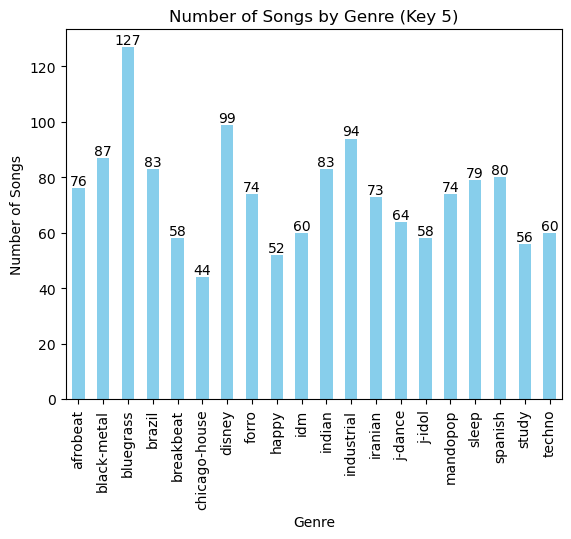

In [10]:
key = df[df['key'] == 2]
genre_counts = key['genre'].value_counts()
genre_counts = genre_counts.sort_index()

genre_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Songs by Genre (Key 5)')
plt.xlabel('Genre')
plt.ylabel('Number of Songs')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

for i, value in enumerate(genre_counts):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

In [11]:
# Changed 'genre' from a string value to a numerical value.

genre_n = {'afrobeat': 0, 'black-metal': 1, 'bluegrass': 2, 'brazil': 3, 'breakbeat': 4, 'chicago-house': 5, 'disney': 6, 'forro': 7, 'happy': 8, 'idm': 9, 'indian': 10, 'industrial': 11, 'iranian': 12, 'j-dance': 13, 'j-idol': 14, 'mandopop': 15, 'sleep': 16, 'spanish': 17, 'study': 18, 'techno': 19}
genre_n

#Legend: 
# afrobeat: 0 
# black-metal: 1
# bluegrass: 2
#brazil: 3
#breakbeat: 4
#chicago-house: 5
#disney: 6
#forro: 7
#happy: 8 
#idm: 9
#indian: 10
#industrial: 11 
#iranian: 12 
#j-dance: 13 
#j-idol: 14
#mandopop: 15 
#sleep: 16 
#spanish: 17
#study: 18 
#techno: 19

numgenres = df.replace({"genre": genre_n})
numgenres.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
0,Long Road,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,1.0,0.0975,0.302000,0.53600,0.281,0.6350,142.221,4.0,567.0,141.0,1.279305,13
1,"Daniâl My Son, Where Did You Vanish?",444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0,0.0805,0.283000,0.93400,0.360,0.0336,75.596,4.0,617.0,155.0,2.367412,12
2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,0.0397,0.000089,0.80000,0.262,0.4890,116.628,4.0,652.0,162.0,3.700483,1
3,Can't Look Away,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,1.0,0.0765,0.066400,0.00127,0.117,0.3850,140.880,4.0,619.0,155.0,1.279305,2
4,Thunderground,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,1.0,0.0539,0.000576,0.09690,0.299,0.6370,143.956,4.0,733.0,183.0,4.067086,8


In [12]:
# dropped the columns containing strings so that they wouldn't interfere with correlation calculations.

todrop = ['name','artists','album_name', 'explicit']

nostrings = numgenres.drop(columns = todrop)

nostrings.head()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
0,241760,46,0.690,0.513,5,-12.529,1.0,0.0975,0.302000,0.53600,0.281,0.6350,142.221,4.0,567.0,141.0,1.279305,13
1,444000,0,0.069,0.196,1,-24.801,0.0,0.0805,0.283000,0.93400,0.360,0.0336,75.596,4.0,617.0,155.0,2.367412,12
2,333506,3,0.363,0.854,2,-7.445,NaN,0.0397,0.000089,0.80000,0.262,0.4890,116.628,4.0,652.0,162.0,3.700483,1
3,269800,23,0.523,0.585,5,-5.607,1.0,0.0765,0.066400,0.00127,0.117,0.3850,140.880,4.0,619.0,155.0,1.279305,2
4,307651,25,0.643,0.687,7,-11.340,1.0,0.0539,0.000576,0.09690,0.299,0.6370,143.956,4.0,733.0,183.0,4.067086,8


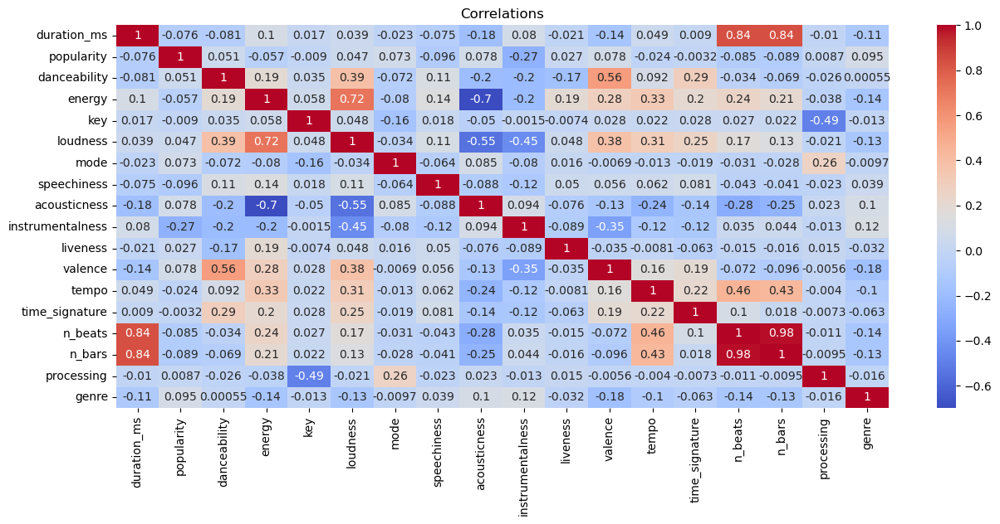

In [20]:
plt.figure(figsize=(15,6))
sns.heatmap(nostrings.corr(), cmap='coolwarm', annot=True)

plt.title('Correlations')
plt.show()

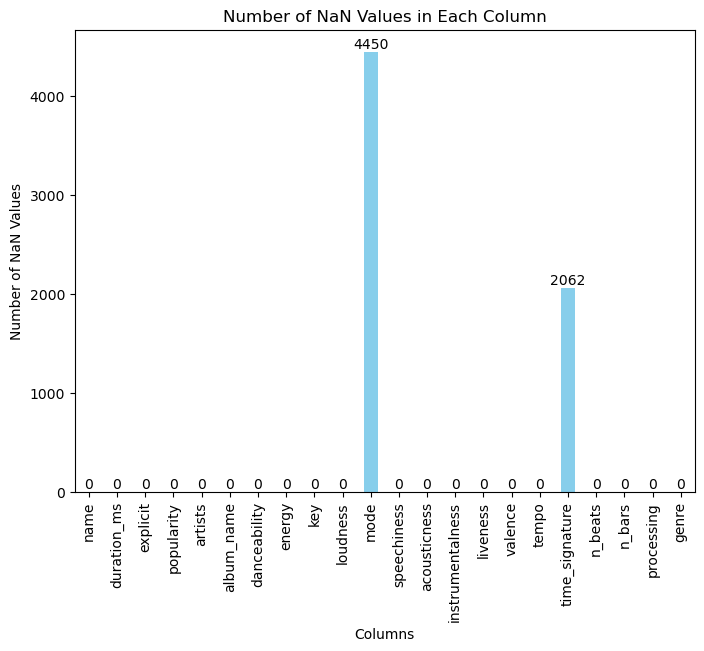

In [21]:
# Calculates the number of NaN values in each column of the original dataframe
nan_counts = df.isna().sum()

# Creates a bar chart
nan_counts.plot(kind='bar', figsize=(8, 6), color='skyblue')
plt.title('Number of NaN Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Number of NaN Values')

for i, value in enumerate(nan_counts):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

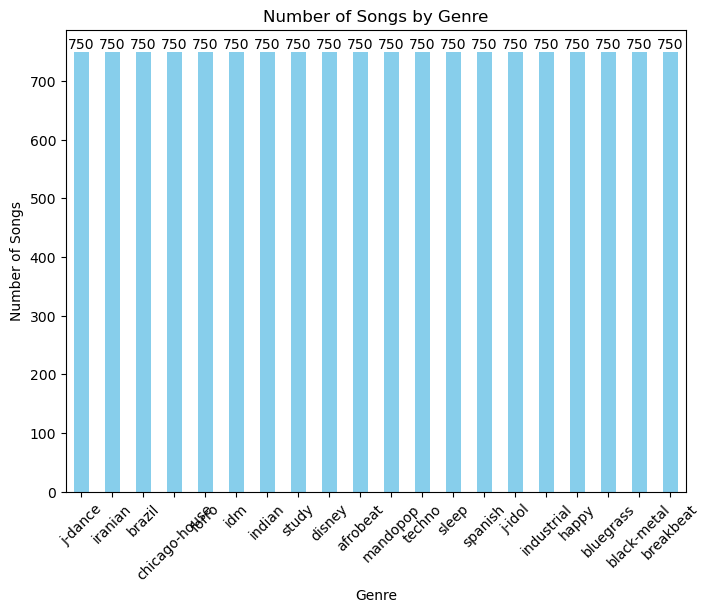

In [22]:
genre_counts = df['genre'].value_counts()

plt.figure(figsize=(8, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Songs by Genre')
plt.xlabel('Genre')
plt.ylabel('Number of Songs')

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
for i, value in enumerate(genre_counts):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

In [23]:
brazil = df[df['genre'] == 'brazil']
brazil.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
42,Filho de Davi,353986,False,49,Tony Allysson,Poderoso Deus,0.578,0.635,2,-5.335,1.0,0.0278,0.6610,0.000000,0.1380,0.343,137.980,4.0,806.0,202.0,3.700483,brazil
48,Acalma Minha Tempestade,384850,False,56,Frei Gilson,Eu Vou Crer em Ti,0.538,0.907,10,-6.877,NaN,0.0515,0.0567,0.000009,0.1780,0.345,134.014,4.0,852.0,214.0,0.757389,brazil
55,E.C.T. - Ao Vivo,210599,False,44,Cássia Eller,Acústico (Ao Vivo),0.666,0.896,7,-8.386,1.0,0.1200,0.6700,0.000003,0.1490,0.633,130.093,NaN,455.0,114.0,4.067086,brazil
76,River of Grace,232653,False,48,Christy Nockels,Be Held : Lullabies for the Beloved,0.521,0.396,11,-10.654,1.0,0.0468,0.8280,0.000766,0.1000,0.398,77.046,4.0,291.0,72.0,0.748116,brazil
123,Pai Nosso - Ao Vivo,213866,False,58,Padre Marcelo Rossi,Padre Marcelo Rossi Sem Limite,0.189,0.624,9,-7.389,1.0,0.0450,0.0877,0.000000,0.0628,0.282,183.259,3.0,645.0,215.0,1.343558,brazil


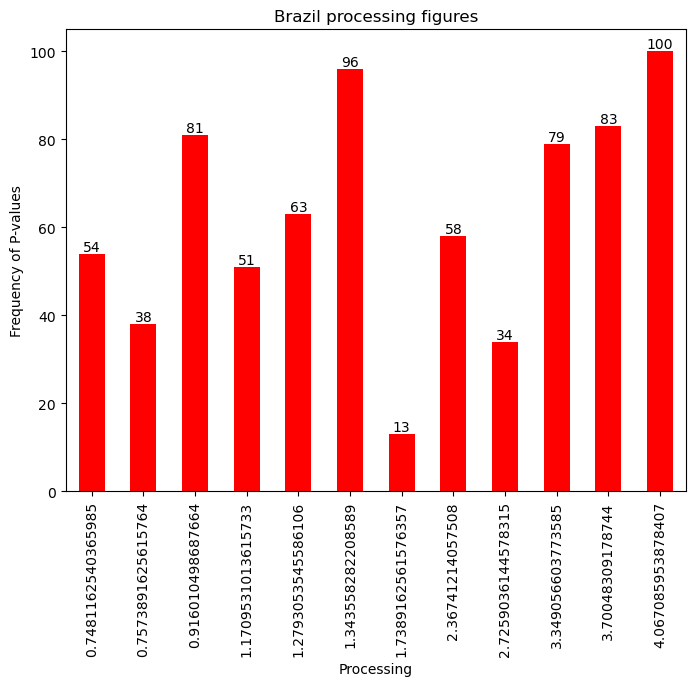

In [24]:
brazil_processing = brazil['processing'].value_counts()

brazil_processing = brazil_processing.sort_index()

plt.figure(figsize=(8, 6))
brazil_processing.plot(kind='bar', color='red')
plt.title('Brazil processing figures')
plt.xlabel('Processing')
plt.ylabel('Frequency of P-values')

for i, value in enumerate(brazil_processing):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()


In [25]:
unique_values = df['genre'].unique()
unique_values

array(['j-dance', 'iranian', 'black-metal', 'bluegrass', 'happy',
       'industrial', 'j-idol', 'spanish', 'sleep', 'techno', 'mandopop',
       'afrobeat', 'disney', 'study', 'indian', 'idm', 'forro',
       'chicago-house', 'brazil', 'breakbeat'], dtype=object)

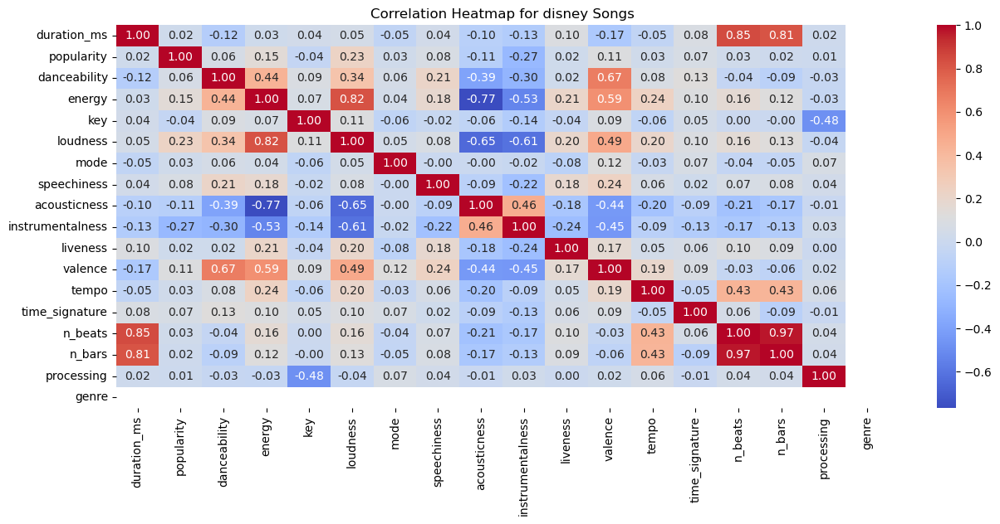

In [26]:
genre_data_disney = nostrings[nostrings['genre'] == 6]
plt.figure(figsize=(15, 6))
correlation_matrix = genre_data_disney.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title(f'Correlation Heatmap for disney Songs')
plt.show()

In [27]:
mostpopular = df[df['popularity'] > 80]
mostpopular.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
285,Baarishein,207309,False,81,Anuv Jain,Baarishein,0.475,0.124,2,-9.463,NaN,0.0444,0.9260,0.000000,0.0972,0.190,94.420,4.0,283.0,70.0,3.700483,indian
1570,Devuélveme a mi chica,194866,False,81,Hombres G,Hombres G (Edición 30 Aniversario),0.603,0.843,9,-7.597,0.0,0.0557,0.0031,0.033700,0.4450,0.503,172.676,4.0,543.0,137.0,1.343558,spanish
1701,Love You Like A Love Song,188453,False,83,Selena Gomez & The Scene,When The Sun Goes Down,0.858,0.678,1,-3.870,0.0,0.0469,0.0761,0.000000,0.0741,0.922,117.009,4.0,360.0,89.0,2.367412,breakbeat
2438,This Girl (Kungs Vs. Cookin' On 3 Burners),195546,False,81,Kungs;Cookin' On 3 Burners,Layers,0.792,0.717,0,-4.759,0.0,0.0393,0.0927,0.000036,0.2260,0.466,121.985,NaN,392.0,97.0,3.349057,chicago-house
2529,CUFF IT,225388,True,88,Beyoncé,RENAISSANCE,0.780,0.689,7,-5.668,1.0,0.1410,0.0368,0.000010,0.0698,0.642,115.042,NaN,432.0,107.0,4.067086,breakbeat


In [28]:
mostpopular.shape

(22, 22)

In [29]:
mostpopular_sorted = mostpopular.sort_values(by='popularity', ascending=False)
mostpopular_sorted.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
5892,Clean White Noise - Loopable with no fade,90228,False,94,White Noise Baby Sleep;White Noise for Babies,Best White Noise for Baby Sleep - Loopable wit...,0.000,0.00342,8,-28.460,1.0,0.0000,0.79100,1.000000,0.1110,0.000,0.000,0.0,0.0,0.0,2.725904,sleep
9631,That's What I Like,206693,False,88,Bruno Mars,24K Magic,0.853,0.56000,1,-4.961,NaN,0.0406,0.01300,0.000000,0.0944,0.860,134.066,4.0,457.0,114.0,2.367412,breakbeat
2529,CUFF IT,225388,True,88,Beyoncé,RENAISSANCE,0.780,0.68900,7,-5.668,1.0,0.1410,0.03680,0.000010,0.0698,0.642,115.042,NaN,432.0,107.0,4.067086,breakbeat
14482,Uptown Funk (feat. Bruno Mars),269666,True,85,Mark Ronson;Bruno Mars,Uptown Special,0.856,0.60900,0,-7.223,NaN,0.0824,0.00801,0.000082,0.0344,0.928,114.988,4.0,511.0,128.0,3.349057,breakbeat
2952,Don't Start Now,183290,False,85,Dua Lipa,Future Nostalgia,0.793,0.79300,11,-4.521,0.0,0.0830,0.01230,0.000000,0.0951,0.679,123.950,4.0,371.0,92.0,0.748116,breakbeat


In [30]:
df.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
0,Long Road,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,1.0,0.0975,0.302000,0.53600,0.281,0.6350,142.221,4.0,567.0,141.0,1.279305,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0,0.0805,0.283000,0.93400,0.360,0.0336,75.596,4.0,617.0,155.0,2.367412,iranian
2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,0.0397,0.000089,0.80000,0.262,0.4890,116.628,4.0,652.0,162.0,3.700483,black-metal
3,Can't Look Away,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,1.0,0.0765,0.066400,0.00127,0.117,0.3850,140.880,4.0,619.0,155.0,1.279305,bluegrass
4,Thunderground,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,1.0,0.0539,0.000576,0.09690,0.299,0.6370,143.956,4.0,733.0,183.0,4.067086,happy


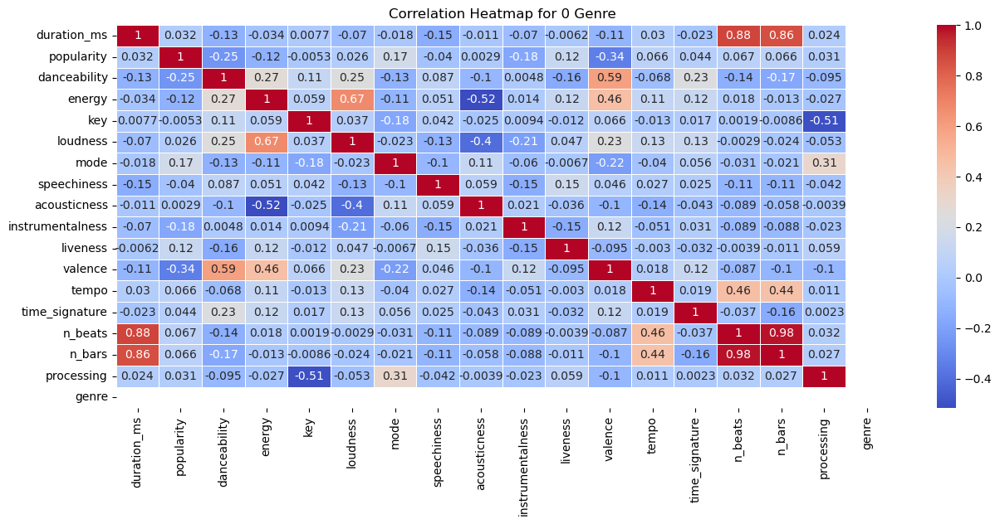

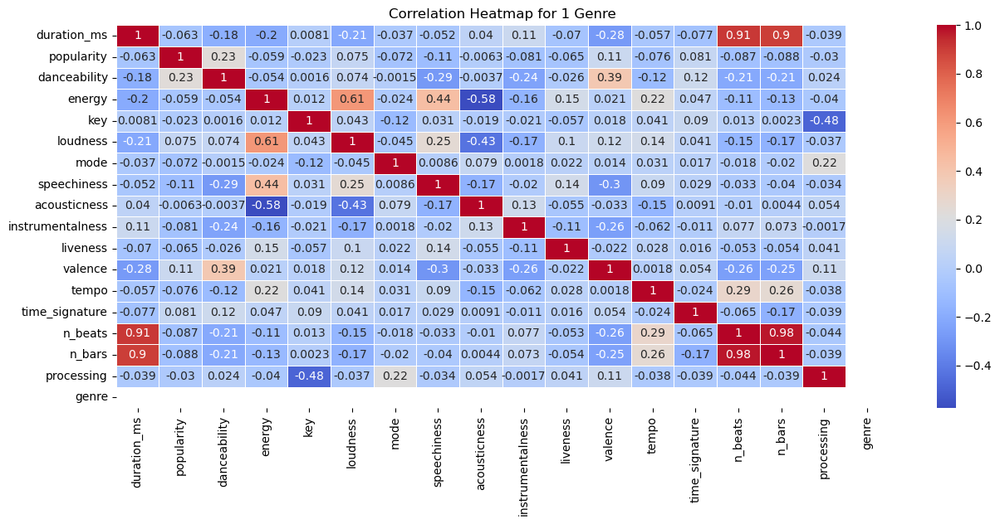

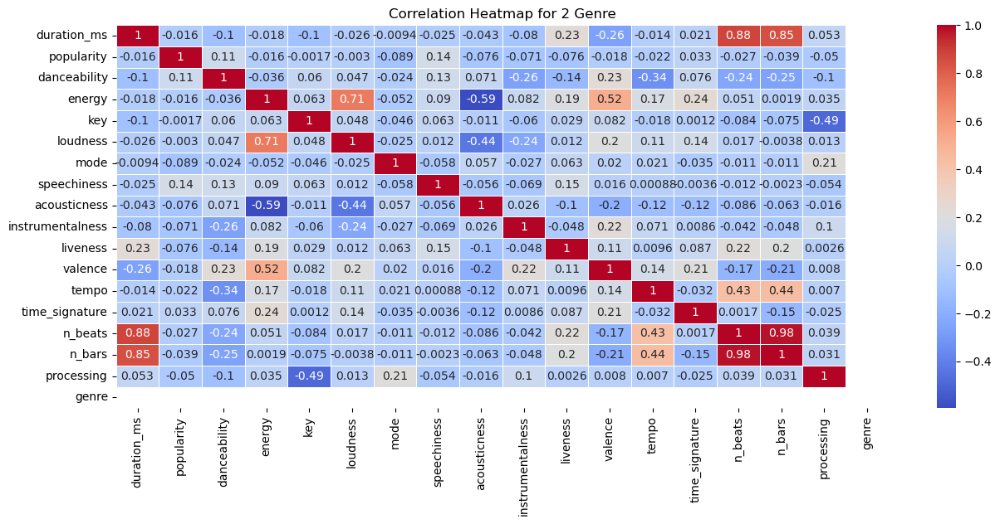

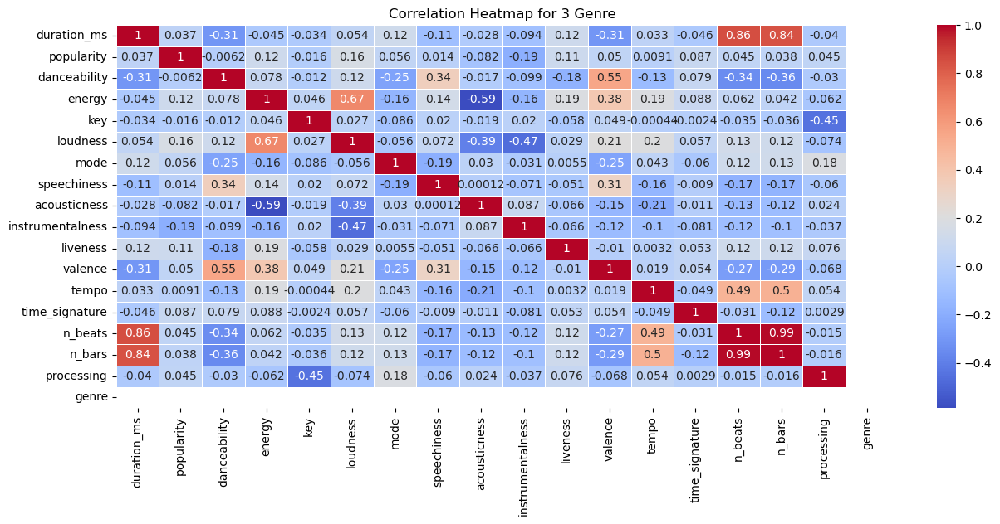

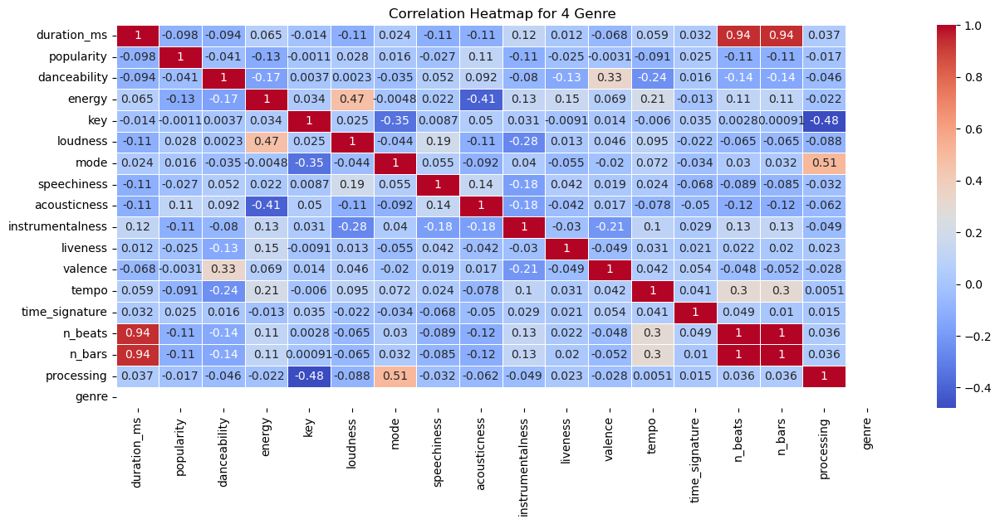

...

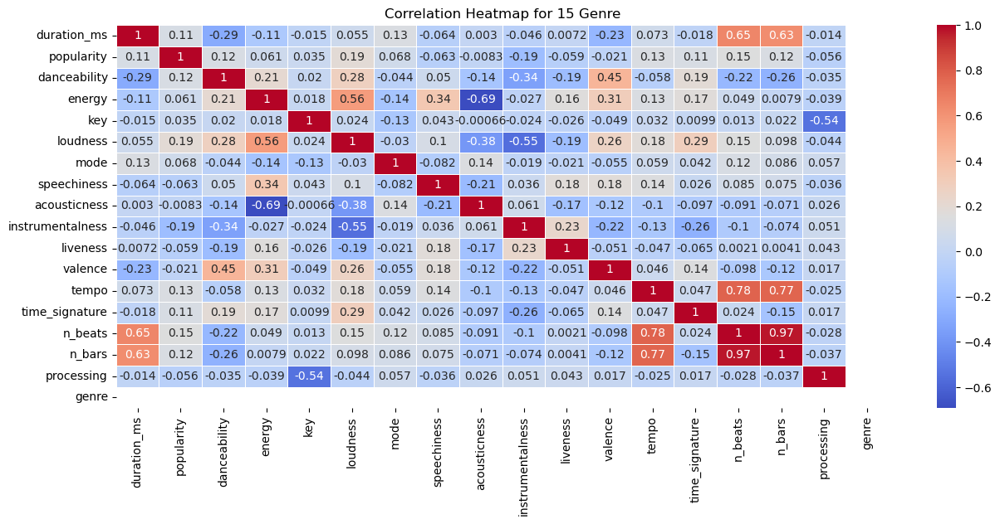

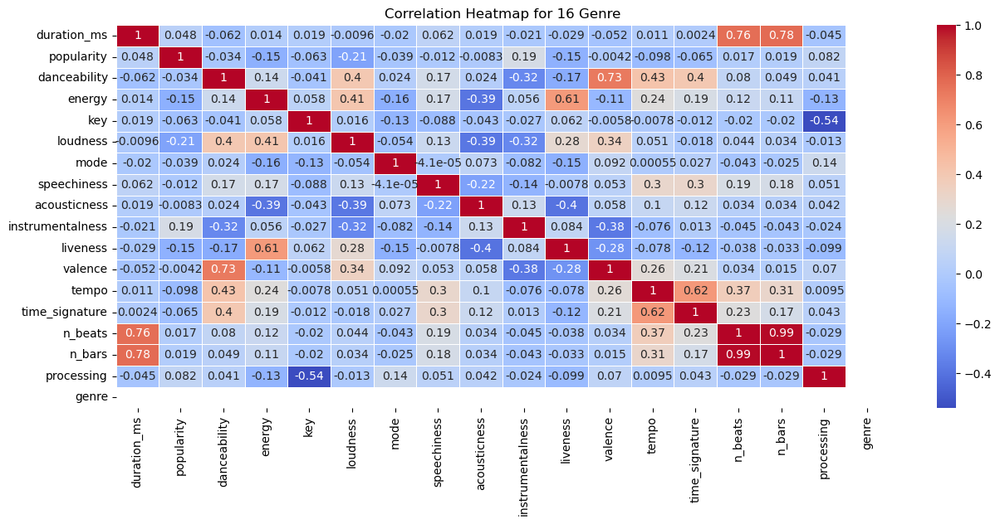

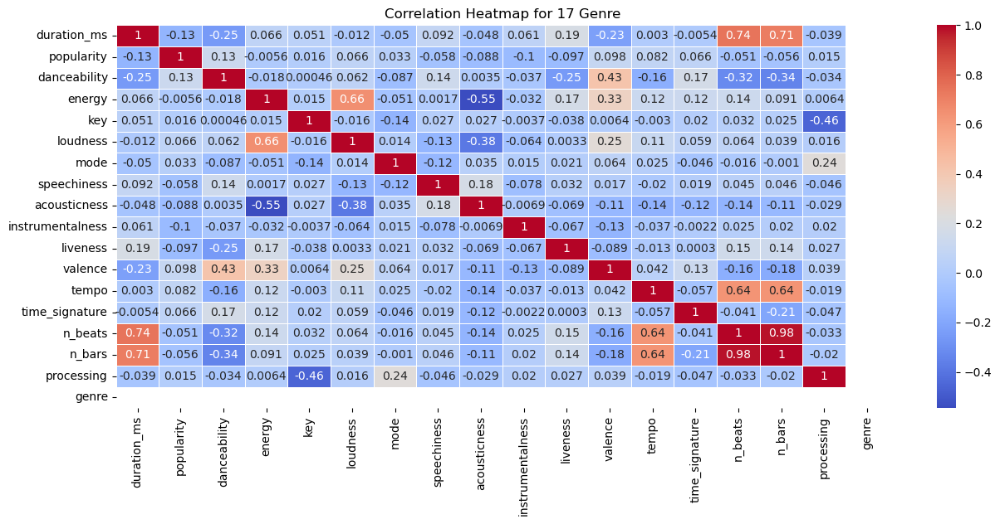

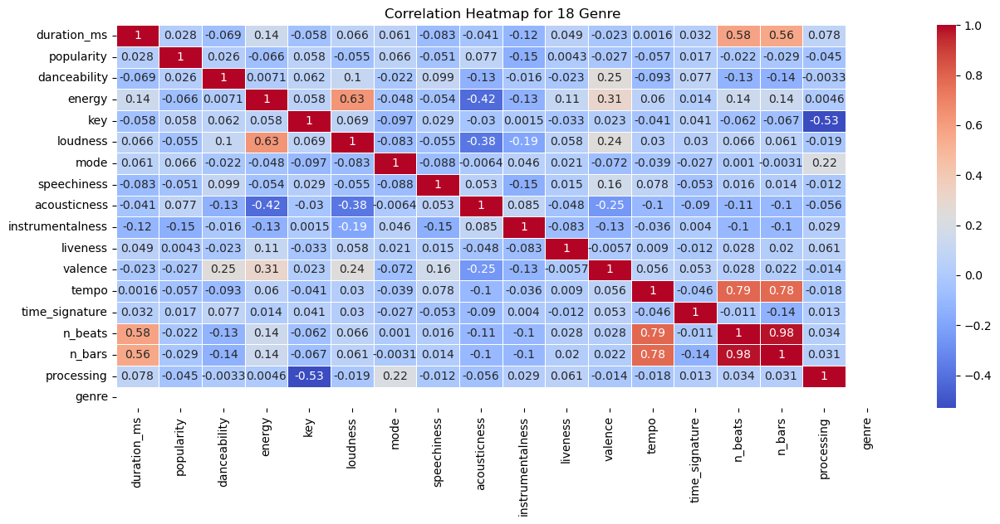

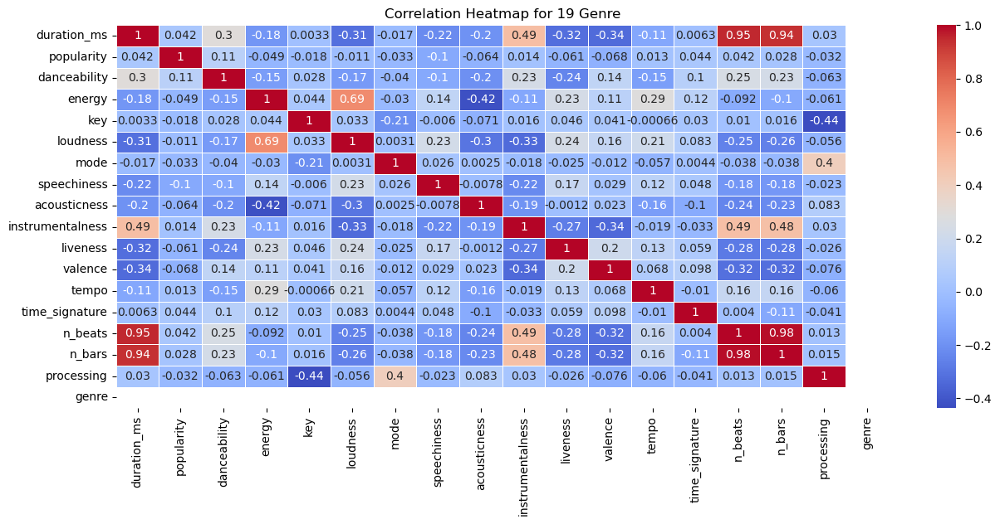

In [31]:
# Get a list of unique genres in your DataFrame

sortedgenres = nostrings.sort_values(by = "genre")

unique_genres = sortedgenres['genre'].unique()

# Loop through each genre and create a correlation heatmap
for genre in unique_genres:
    subset = nostrings[nostrings['genre'] == genre]  # Filter data by genre
    corr_matrix = subset.corr()  # Compute the correlation matrix

    plt.figure(figsize=(15, 6))  # Set the figure size
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
    plt.title(f'Correlation Heatmap for {genre} Genre')
    plt.show()


C:\Users\javie\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


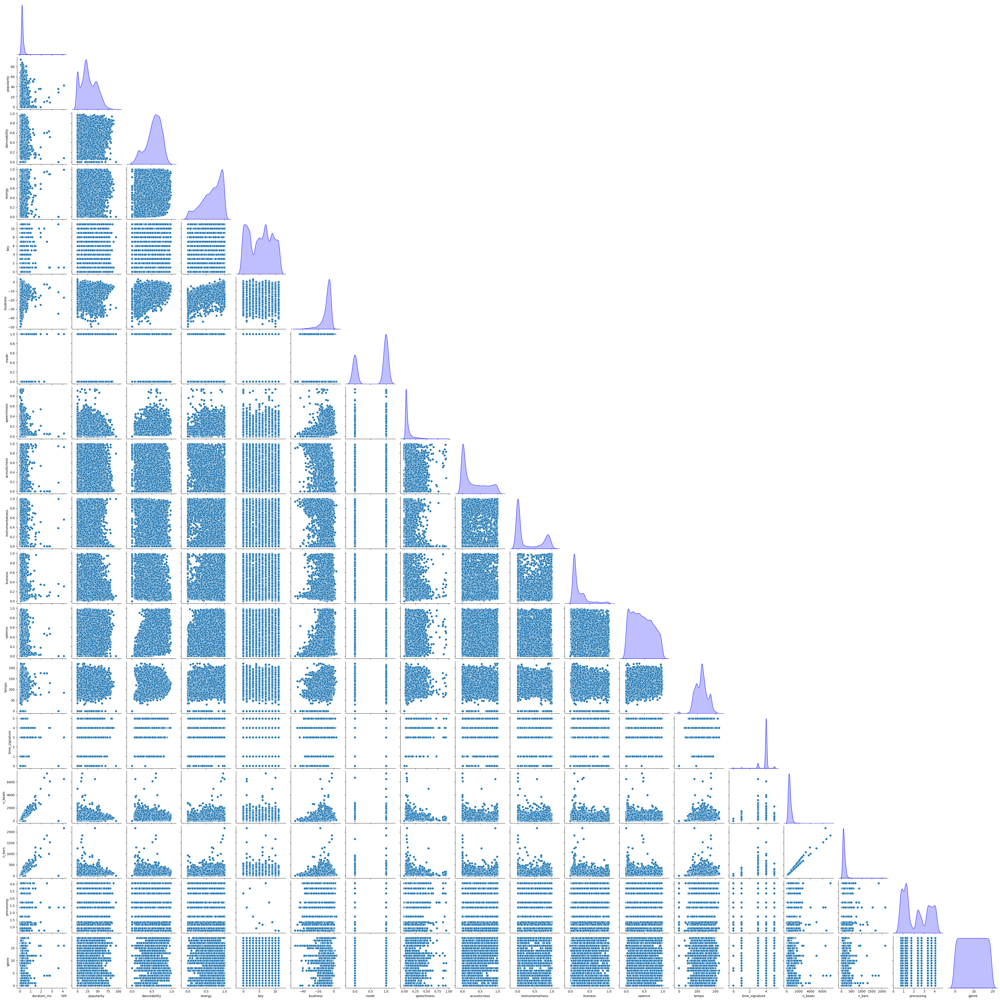

In [32]:
sns.pairplot(nostrings, kind='scatter', corner='kde', diag_kind='kde', plot_kws={'s': 50}, diag_kws={'color': 'blue'})
plt.show()

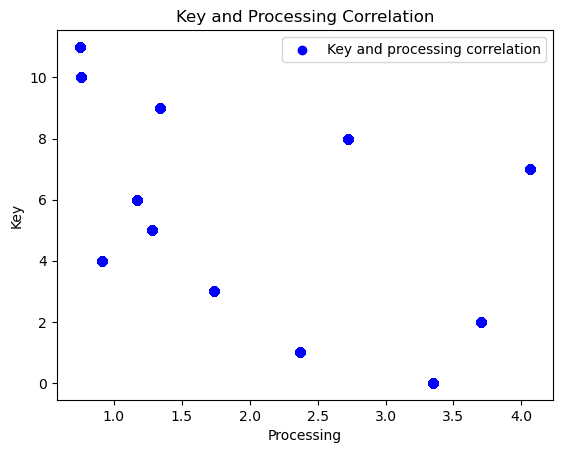

In [33]:
# Assuming you have a Pandas DataFrame named 'df'
x_data = df['processing']
y_data = df['key']

# Create a scatterplot
plt.scatter(x_data, y_data, label='Key and processing correlation', color='blue', marker='o')

# Add labels and a title
plt.xlabel('Processing')
plt.ylabel('Key')
plt.title('Key and Processing Correlation')

# Add a legend (optional)
plt.legend()

# Show the plot
plt.show()

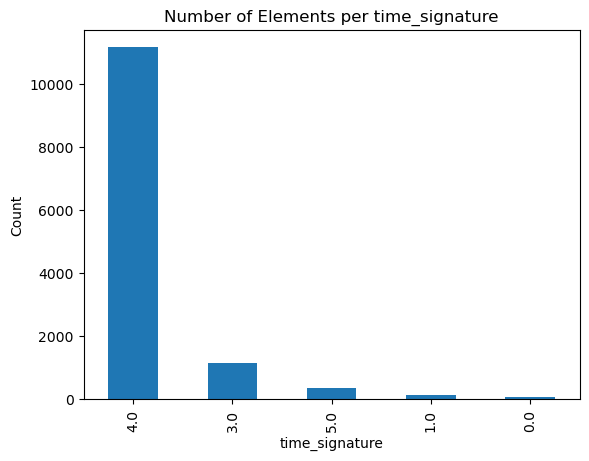

In [35]:
# Count the number of elements in the 'Category' column
category_counts = df['time_signature'].value_counts()

# Create a bar chart
category_counts.plot(kind='bar')

# Add labels and a title
plt.xlabel('time_signature')
plt.ylabel('Count')
plt.title('Number of Elements per time_signature')

# Show the plot
plt.show()


## Distibution for each column of interest

In [36]:
interestingFeatureColumns = ['tempo', 'loudness', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'valence']

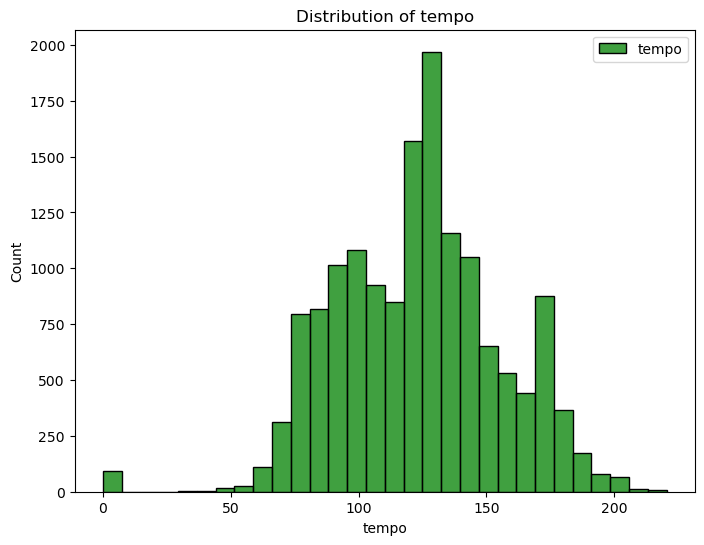

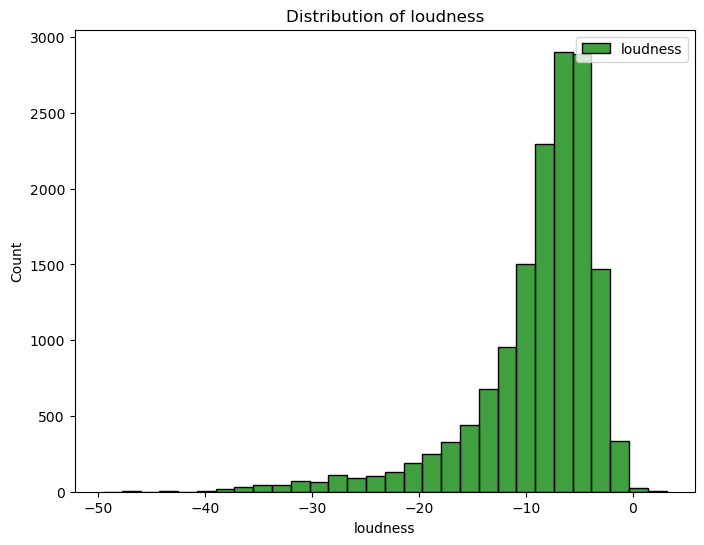

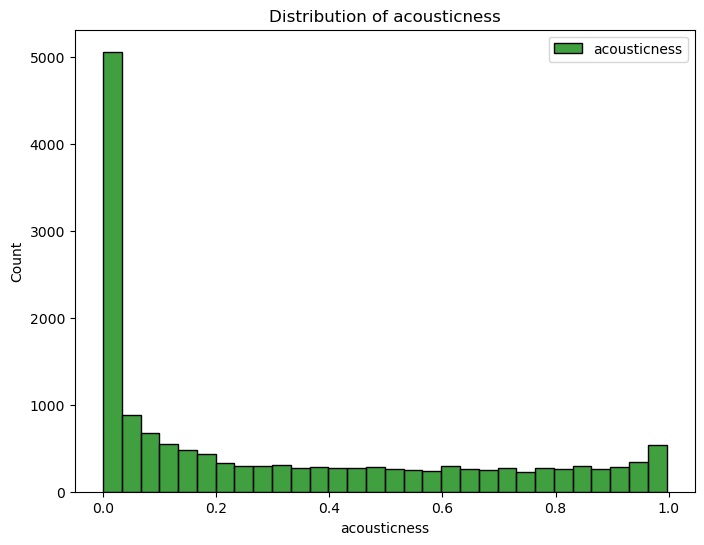

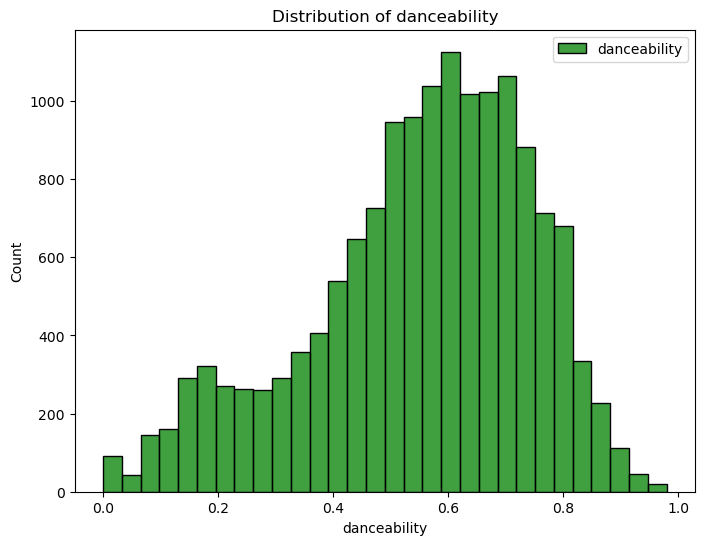

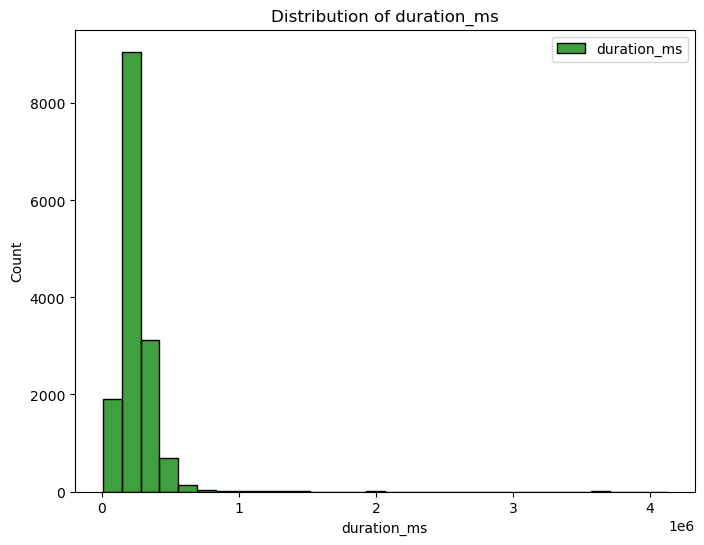

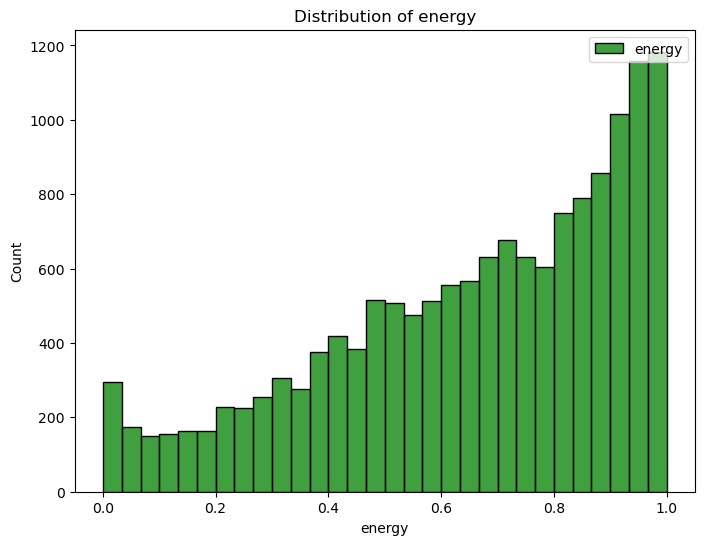

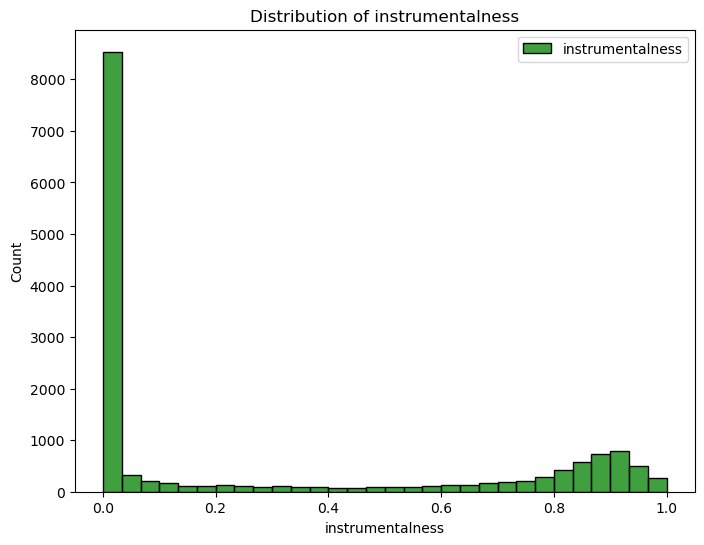

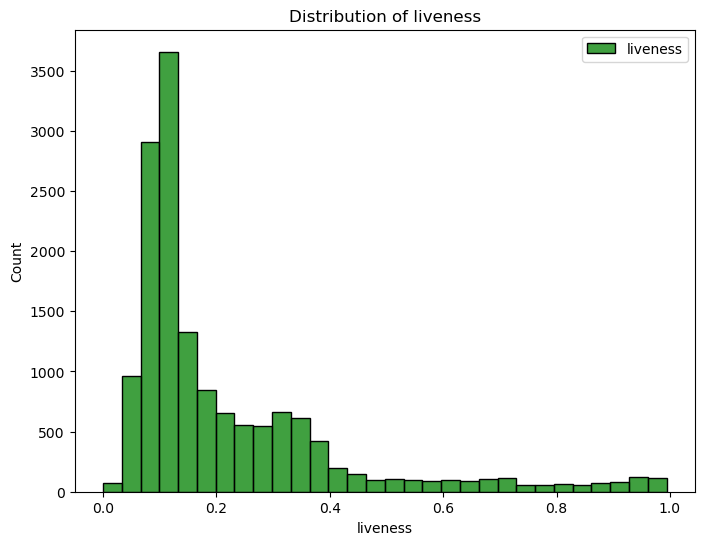

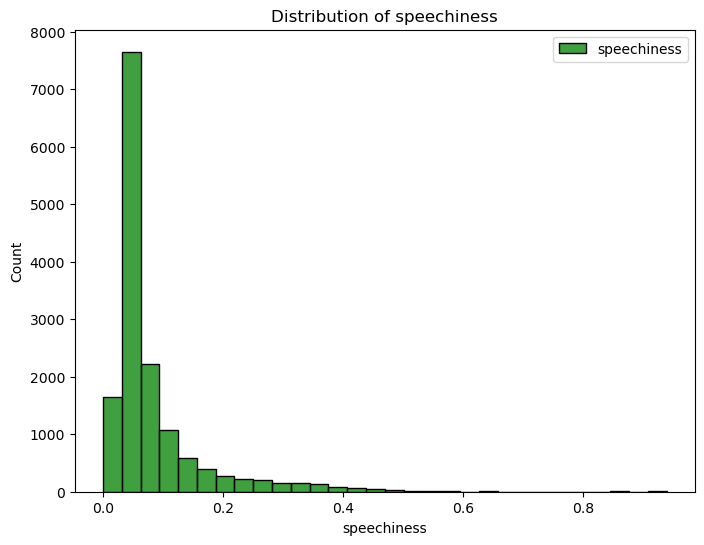

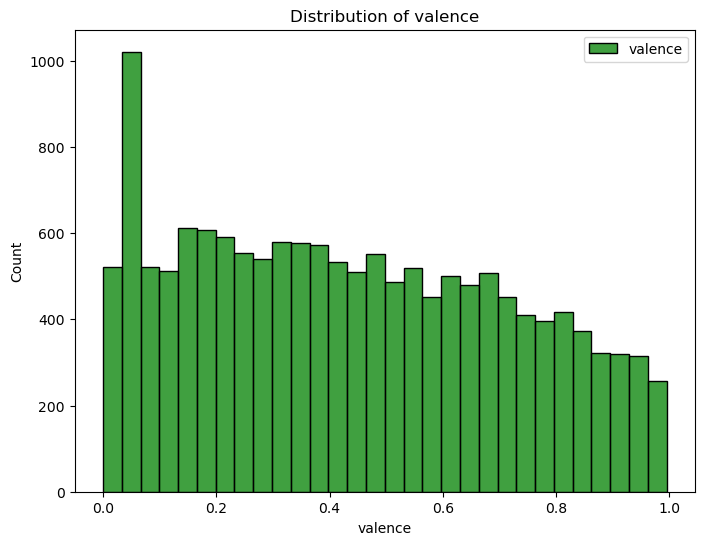

In [37]:
for i in interestingFeatureColumns:
    plt.figure(figsize=(8,6))
    sns.histplot(df[i], bins=30, label=i, color='green')
    plt.legend(loc='upper right')
    plt.title(f'Distribution of {i}')
    plt.show()

## Columns with NaN values

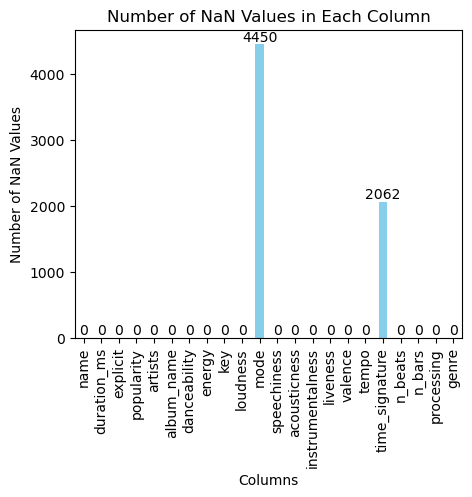

In [38]:
nan_counts = df.isna().sum()

# Creates a bar chart
nan_counts.plot(kind='bar', figsize=(5, 4), color='skyblue')
plt.title('Number of NaN Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Number of NaN Values')

for i, value in enumerate(nan_counts):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

In [39]:
# Select rows with NaNs in the specific column
df_with_nans = df[df['mode'].isna()]

# Display the rows with NaNs
df_with_nans.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,0.0397,0.000089,0.800000,0.2620,0.4890,116.628,4.0,652.0,162.0,3.700483,black-metal
5,Sick Bubblegum,224266,True,32,Rob Zombie,Hellbilly Deluxe 2 (Standard Explicit),0.642,0.972,5,-3.047,NaN,0.0967,0.001520,0.000024,0.3840,0.4210,118.035,4.0,432.0,106.0,1.279305,industrial
7,Quiero tener tu presencia,220626,False,64,Seguridad Social,Furia Latina,0.741,0.816,4,-5.597,NaN,0.0797,0.021100,0.000000,0.0981,0.5740,146.075,4.0,517.0,129.0,0.916010,spanish
8,Shhhh Baby Shusher Mama Shushing Background Fa...,116815,False,45,Baby Sleep;Baby Shushing;Dreams of Dreams,Shhhh Baby Shusher Mama Shushing Background Fa...,0.153,0.119,6,-25.160,NaN,0.0501,0.704000,0.913000,0.5430,0.0342,84.886,NaN,162.0,40.0,1.170953,sleep
13,知足,256692,False,51,Mayday,知足 just my pride 最真傑作選,0.406,0.230,4,-9.007,NaN,0.0297,0.880000,0.000000,0.1070,0.3950,159.914,4.0,667.0,167.0,0.916010,mandopop


In [40]:
df_with_nans.shape

(4450, 22)

In [41]:
# Select rows with NaNs in the specific column
df_with_nans2 = df[df['time_signature'].isna()]

# Display the rows with NaNs
df_with_nans2

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
8,Shhhh Baby Shusher Mama Shushing Background Fa...,116815,False,45,Baby Sleep;Baby Shushing;Dreams of Dreams,Shhhh Baby Shusher Mama Shushing Background Fa...,0.153,0.119,6,-25.160,NaN,0.0501,0.704000,0.913000,0.5430,0.0342,84.886,NaN,162.0,40.0,1.170953,sleep
15,Escalate,220666,False,25,X-RX,Activate the Machinez,0.529,0.990,9,-4.075,NaN,0.0422,0.000821,0.074300,0.3060,0.5890,135.989,NaN,488.0,121.0,1.343558,industrial
20,Beqaaboo,187266,False,53,OAFF;Savera;Shalmali Kholgade;Kausar Munir,Gehraiyaan (Original Motion Picture Soundtrack),0.679,0.663,9,-6.279,NaN,0.0510,0.022100,0.006090,0.3510,0.5110,123.985,NaN,384.0,97.0,1.343558,indian
23,Ukon Laulu,252556,False,27,Lepoka,Bibere Vivere,0.373,0.927,7,-4.140,NaN,0.0900,0.000365,0.000162,0.0878,0.4790,180.012,NaN,745.0,188.0,4.067086,spanish
26,Soim In Vazduh,417025,False,20,Bucovina,Sub Stele,0.497,0.974,0,-5.032,1.0,0.0821,0.000247,0.349000,0.2520,0.2320,154.991,NaN,1068.0,269.0,3.349057,black-metal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14981,ロケンロー,254887,False,25,BiSH,LETTERS,0.513,0.806,2,-3.726,NaN,0.0294,0.001260,0.000008,0.1060,0.8580,95.031,NaN,398.0,100.0,3.700483,j-idol
14984,Deva Deva (Kannada),276964,False,39,Pritam;Sanjith Hegde;Arijit Singh;Jonita Gandhi,Brahmastra (Kannada) [Original Motion Picture ...,0.560,0.730,0,-7.485,NaN,0.0377,0.645000,0.001430,0.1350,0.5060,112.052,NaN,499.0,124.0,3.349057,indian
14985,Fudge,129882,False,10,StopLock,Fudge,0.436,0.368,4,-15.017,0.0,0.5120,0.920000,0.452000,0.0602,0.1880,85.094,NaN,260.0,65.0,0.916010,study
14991,Nuh Frighten Fi Ntn,237270,False,22,Chronic Law,Nuh Frighten Fi Ntn,0.567,0.571,5,-7.474,NaN,0.2610,0.715000,0.000000,0.1050,0.5330,99.320,NaN,282.0,69.0,1.279305,j-dance


In [42]:
df_with_nans2.shape

(2062, 22)

In [43]:
# Select rows with NaNs in the specific column
df_with_zeros = df[df['acousticness'] == 0]

# Display the rows with NaNs
df_with_zeros.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
81,The Sicarii,222880,False,1,Ninkharsag,Blood Of Celestial Kings,0.1720,0.95100,6,-5.129,0.0,0.0992,0.0,0.886,0.115,0.19700,122.020,4.0,447.0,111.0,1.170953,black-metal
315,Soothing Massage Rain,267496,False,0,Nature Sounds,Relaxing Rain Sounds,0.0765,0.00291,4,-23.323,0.0,0.2680,0.0,0.571,0.354,0.00184,170.023,4.0,692.0,174.0,0.916010,sleep
1301,Sing for Devastation,273253,True,20,Nordjevel,Nordjevel,0.0846,0.95700,11,-5.085,1.0,0.1100,0.0,0.349,0.287,0.16300,169.943,4.0,698.0,176.0,0.748116,black-metal
2105,Pure White Noise - Loopable with No Fade,73886,False,27,Sleep Baby Sleep;Relaxation;White Noise Medita...,"Brown Noise, White Noise, and Binaural Beats E...",0.0000,0.00000,0,-8.437,0.0,0.0000,0.0,0.000,0.000,0.00000,0.000,0.0,0.0,0.0,3.349057,sleep
2749,Static Rainstorm,99030,False,0,Binaural Beats Brain Waves Isochronic Tones Br...,! ! ! ! ! Whispers ! ! ! ! !,0.0000,0.00002,1,-25.162,1.0,0.0000,0.0,0.977,0.320,0.00000,0.000,0.0,0.0,0.0,2.367412,sleep


In [44]:
df_with_zeros.shape

(18, 22)

In [45]:
# Select rows with NaNs in the specific column
df_with_zeros2 = df[df['instrumentalness'] == 0]

# Display the rows with NaNs
df_with_zeros2.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
7,Quiero tener tu presencia,220626,False,64,Seguridad Social,Furia Latina,0.741,0.816,4,-5.597,NaN,0.0797,0.02110,0.0,0.0981,0.574,146.075,4.0,517.0,129.0,0.916010,spanish
13,知足,256692,False,51,Mayday,知足 just my pride 最真傑作選,0.406,0.230,4,-9.007,NaN,0.0297,0.88000,0.0,0.1070,0.395,159.914,4.0,667.0,167.0,0.916010,mandopop
22,→,282893,False,18,SILENT SIREN,Silent Siren Selection,0.522,0.805,9,-5.427,1.0,0.0436,0.00608,0.0,0.2650,0.616,176.127,4.0,815.0,203.0,1.343558,j-idol
25,えっと干支がーる,204000,False,28,夜光性アミューズ,えっと干支がーる,0.684,0.898,10,-4.965,1.0,0.0494,0.01740,0.0,0.3230,0.808,100.021,4.0,324.0,81.0,0.757389,j-idol
28,愛上你算我賤,250941,False,55,NICKTHEREAL,REAL LIFE,0.478,0.738,6,-4.464,0.0,0.0414,0.00432,0.0,0.1540,0.353,163.994,4.0,670.0,167.0,1.170953,mandopop


In [46]:
df_with_zeros2.shape

(3798, 22)

In [47]:
# Select rows with NaNs in the specific column
df_with_nans2 = df_with_zeros2[df_with_zeros2['mode'].isna()]

# Display the rows with NaNs
df_with_nans2.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
7,Quiero tener tu presencia,220626,False,64,Seguridad Social,Furia Latina,0.741,0.816,4,-5.597,NaN,0.0797,0.0211,0.0,0.0981,0.574,146.075,4.0,517.0,129.0,0.916010,spanish
13,知足,256692,False,51,Mayday,知足 just my pride 最真傑作選,0.406,0.230,4,-9.007,NaN,0.0297,0.8800,0.0,0.1070,0.395,159.914,4.0,667.0,167.0,0.916010,mandopop
71,ラッキー7,194920,False,26,Flower,Hitomi No Oku No Milkyway,0.674,0.914,7,-3.311,NaN,0.0467,0.0160,0.0,0.0402,0.778,93.003,4.0,293.0,73.0,4.067086,j-idol
135,Tiê,236733,False,20,Sambabook;Criolo,"Sambabook Dona Ivone Lara, Vol. 1",0.668,0.516,11,-9.196,NaN,0.0726,0.6450,0.0,0.0987,0.858,89.252,4.0,344.0,87.0,0.748116,afrobeat
138,Billo Rani,329247,False,58,Pritam;Anand Raj Anand;Richa Sharma,Dhan Dhana Dhan Goal,0.710,0.845,11,-6.878,NaN,0.1110,0.2570,0.0,0.1920,0.846,98.016,4.0,534.0,134.0,0.748116,indian


## Checked if there was a connection between NaNs in mode and time_signature and the amount of zeroes in instrumentalness and acousticness

# none was found